## Arnav Agrawal
## 229310426

# Experiment 1
### 16th January 2025

In [1]:
import cv2
import matplotlib.pyplot as plt

import numpy as np

In [2]:
img= cv2.imread('rgb_paint.png')
tmt= cv2.imread('tomato.png')

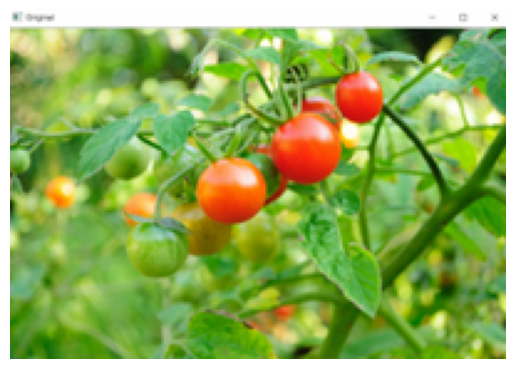

In [3]:
tmt_rgb= cv2.cvtColor(tmt, cv2.COLOR_BGR2RGB)

plt.imshow(tmt_rgb)
plt.axis('off') 
plt.show()

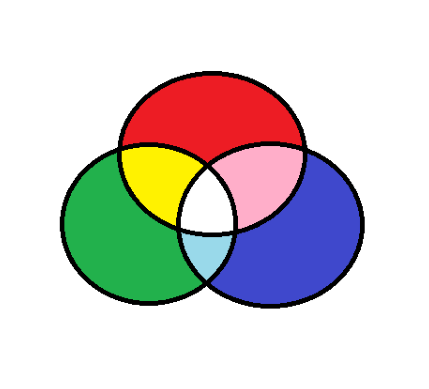

In [44]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_rgb)
plt.axis('off') 
plt.show()

#cv2.imshow('colors',img)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

## Greyscaling

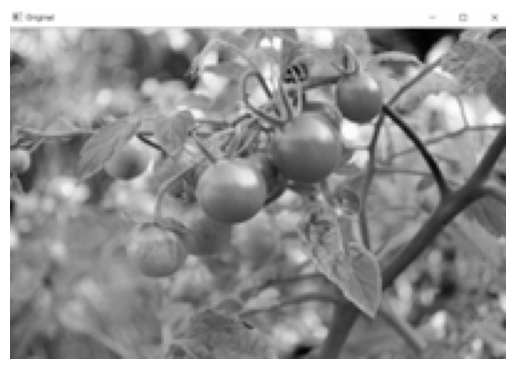

In [5]:
tmt_gray= cv2.imread('tomato.png',cv2.IMREAD_GRAYSCALE)


plt.imshow(tmt_gray, cmap= 'gray')
plt.axis('off')
plt.show()

## Converting format to jpg

In [6]:
cv2.imwrite('gray_tomato.jpg',tmt_gray)

True

## Playing a video

In [7]:
cap = cv2.VideoCapture('test.mp4')
if not cap.isOpened():
    print('Error')

while cap.isOpened():
    ret,frame=cap.read()
    if ret:
        cv2.imshow('Frame', frame)
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()
    

# Experiment 2
## 23rd January 2025

## Scaling operations

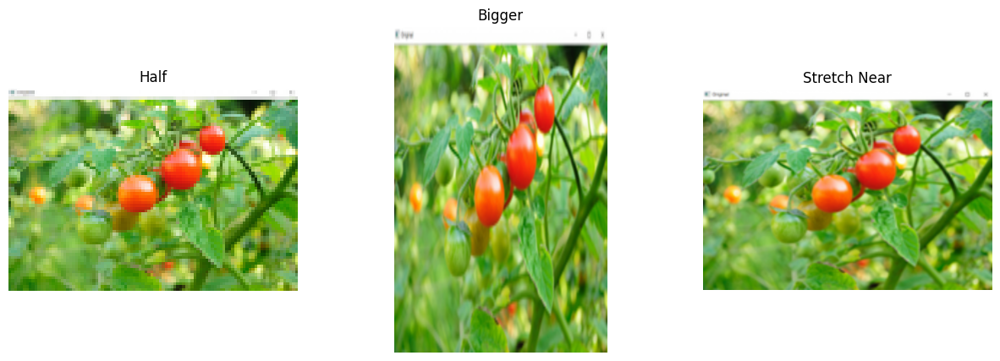

In [8]:
half = cv2.resize(tmt_rgb, (0, 0), fx = 0.5, fy = 0.5)
bigger = cv2.resize(tmt_rgb, (1050, 1610))

stretch_near = cv2.resize(tmt_rgb, (780, 540), 
               interpolation = cv2.INTER_LINEAR)


fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(half)
axs[0].set_title("Half")

axs[1].imshow(bigger)
axs[1].set_title("Bigger")

axs[2].imshow(stretch_near)
axs[2].set_title("Stretch Near")

for ax in axs:
    ax.axis('off')

plt.show()

## Rotation

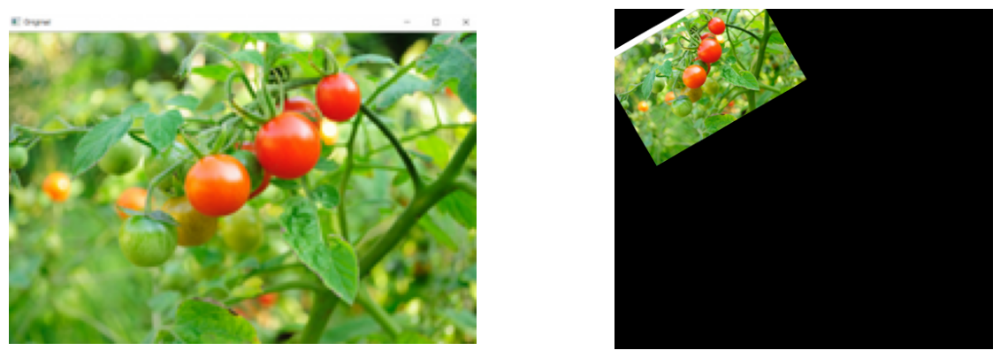

In [9]:
center = (tmt_rgb.shape[1] // 2, tmt_rgb.shape[0] // 2)
angle = 30
scale = 1

rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale)

rotated_image = cv2.warpAffine(tmt_rgb, rotation_matrix, (img.shape[1], img.shape[0]))

fig, axs = plt.subplots(1, 2,  figsize= (15,5))

axs[0].imshow(tmt_rgb)
axs[1].imshow(rotated_image)

for ax in axs:
    ax.axis('off')

plt.show()

### Shearing

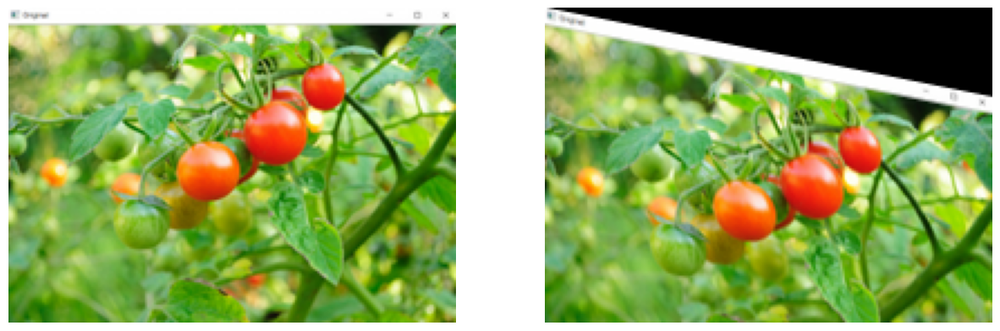

In [10]:
(h, w) = tmt_rgb.shape[:2]

shear_x = 0
shear_y = 0.2  

shear_matrix = np.float32([[1, shear_x, 0],
                           [shear_y, 1, 0]])

sheared_image = cv2.warpAffine(tmt_rgb, shear_matrix, (w, h))

fig, axs = plt.subplots(1, 2,  figsize= (15,5))

axs[0].imshow(tmt_rgb)
axs[1].imshow(sheared_image)

for ax in axs:
    ax.axis('off')

### Shifting

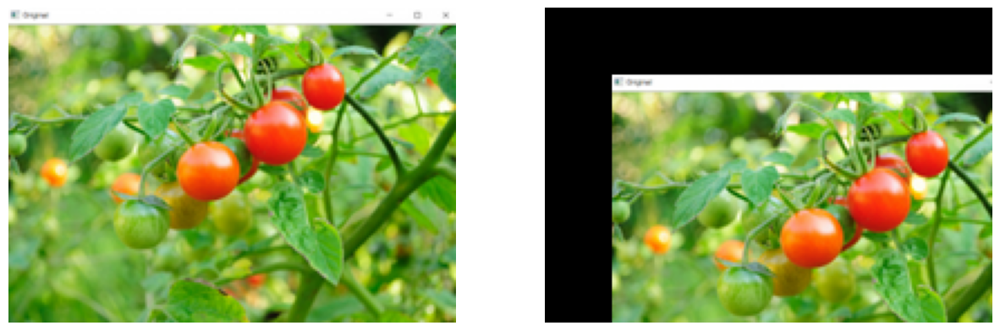

In [11]:
shift_x = 30
shift_y = 30  

translation_matrix = np.float32([[1, 0, shift_x],
                                 [0, 1, shift_y]])

shifted_image = cv2.warpAffine(tmt_rgb, translation_matrix, (w, h))

fig, axs = plt.subplots(1, 2, figsize= (15,5))

axs[0].imshow(tmt_rgb)
axs[1].imshow(shifted_image)

for ax in axs:
    ax.axis('off')

### Reflection

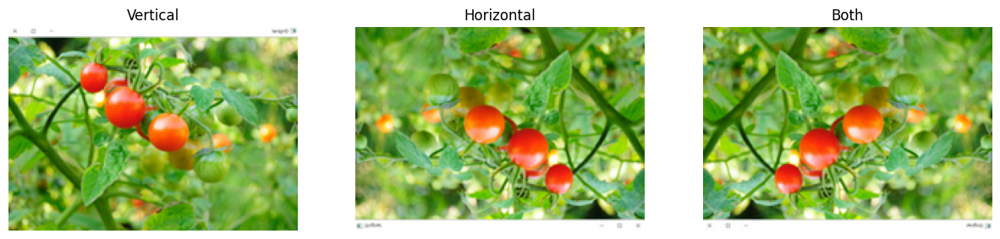

In [12]:
reflected_vertical = cv2.flip(tmt_rgb, 1)
reflected_horizontal = cv2.flip(tmt_rgb, 0)
reflected_both = cv2.flip(tmt_rgb, -1)


fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(reflected_vertical)
axs[0].set_title("Vertical")

axs[1].imshow(reflected_horizontal)
axs[1].set_title("Horizontal")

axs[2].imshow(reflected_both)
axs[2].set_title("Both")

for ax in axs:
    ax.axis('off')

plt.show()

# Experiment 3

### Power Law transform

In [13]:
def power_transform(image, gamma):
    normalized = image / 255
    #print(normalized)
    transformed = np.power(normalized, gamma)
    
    transformed = np.uint8(transformed * 255)
    
    return transformed

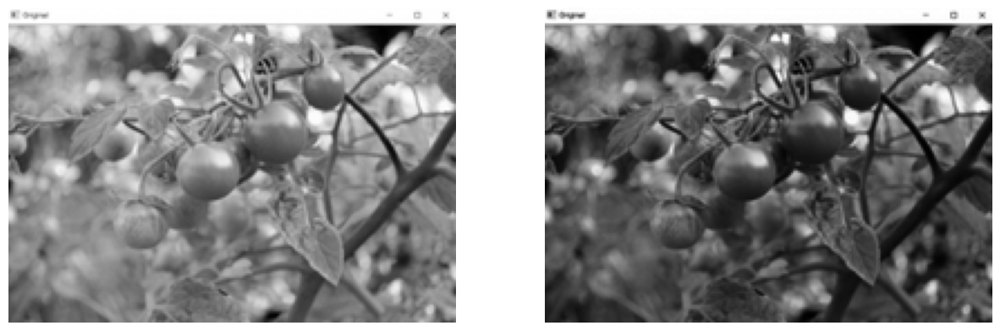

In [14]:
gamma_corrected = power_transform(tmt_gray, gamma = 2)
fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_gray, cmap= 'gray')
axs[1].imshow(gamma_corrected, cmap= 'gray')


for ax in axs:
    ax.axis('off')

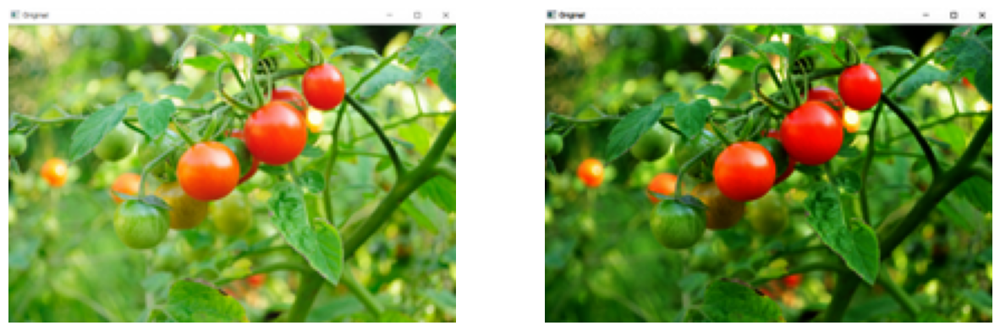

In [15]:
gamma_corrected = power_transform(tmt_rgb, gamma = 2)
fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_rgb, cmap= 'gray')
axs[1].imshow(gamma_corrected, cmap= 'gray')


for ax in axs:
    ax.axis('off')

### Negative Transform

In [16]:
def neg_transform(image, gamma):
    normalized = image
    #print(normalized)
    transformed = np.power(normalized, gamma)
    
    transformed = np.uint8(transformed * 255)
    
    return transformed

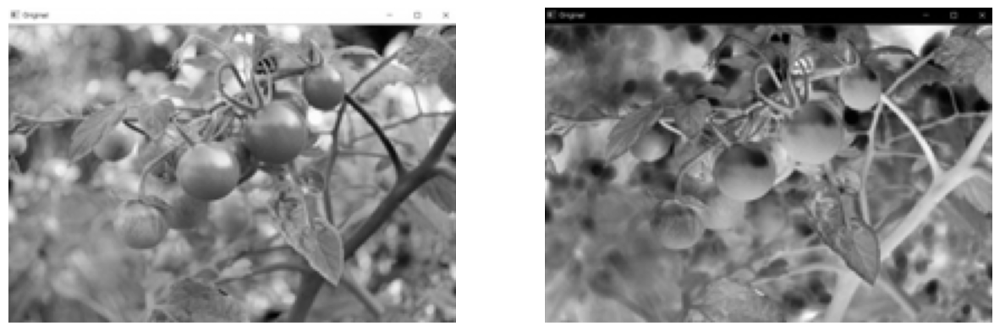

In [17]:
neg = neg_transform(tmt_gray, gamma = 1)

fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_gray, cmap= 'gray')
axs[1].imshow(neg, cmap= 'gray')


for ax in axs:
    ax.axis('off')

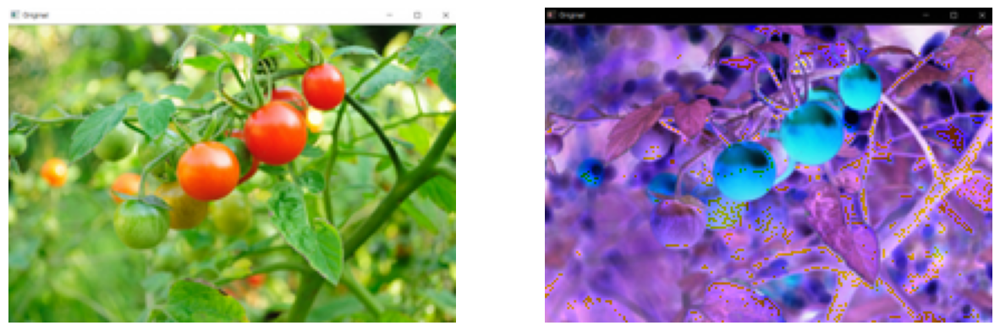

In [18]:
neg = neg_transform(tmt_rgb, gamma = 1)

fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_rgb, cmap= 'gray')
axs[1].imshow(neg, cmap= 'gray')


for ax in axs:
    ax.axis('off')

# Experiment 4 
### 6th February

## Frequency Domain Filtering


In [120]:
atm=cv2.imread('autumn.png')
atm_rgb = cv2.cvtColor(atm, cv2.COLOR_BGR2RGB)
atm_gray = cv2.cvtColor(atm_rgb, cv2.COLOR_BGR2GRAY)

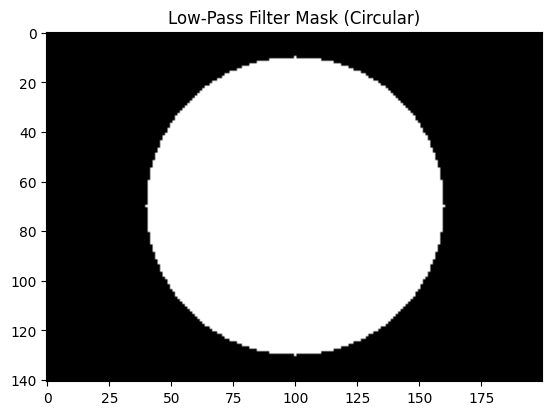

In [19]:
rows, cols = tmt_gray.shape
crow, ccol = rows // 2, cols // 2

#Create a black mask
mask = np.zeros((rows, cols), np.uint8)

#Draw a white circle in the center (Low-Pass Filter)
radius=60
cv2.circle(mask, (ccol, crow), radius, 1, -1)  # White circle at center

# Display the mask
plt.imshow(mask, cmap="gray")
plt.title("Low-Pass Filter Mask (Circular)")
plt.show()

In [20]:
dft = np.fft.fft2(tmt_gray)
dft_shift = np.fft.fftshift(dft)  # Shift zero-frequency component to the center

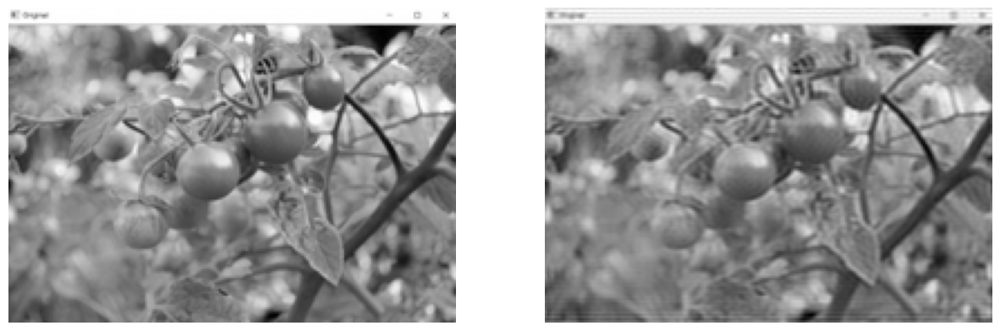

In [21]:
dft_shift_filtered = dft_shift * mask

# Compute Inverse DFT
dft_filtered = np.fft.ifftshift(dft_shift_filtered)
image_filtered = np.fft.ifft2(dft_filtered)
image_filtered = np.abs(image_filtered)  # Convert to real values

# Display results
fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_gray, cmap= 'gray')
axs[1].imshow(image_filtered, cmap= 'gray')


for ax in axs:
    ax.axis('off')

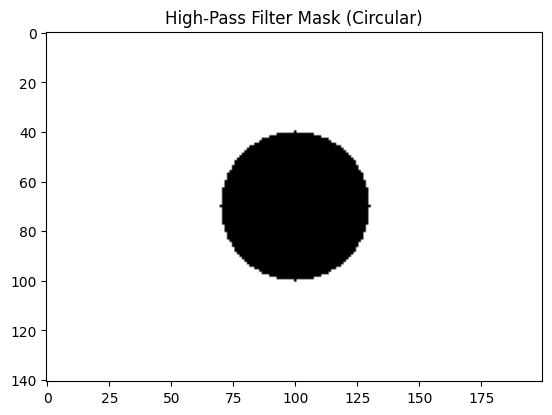

In [22]:
mask = np.ones((rows, cols), np.uint8)
radius1 = 30
cv2.circle(mask, (ccol, crow), radius1, 0, -1)  # Black circle at center

plt.imshow(mask, cmap="gray")
plt.title("High-Pass Filter Mask (Circular)")
plt.show()

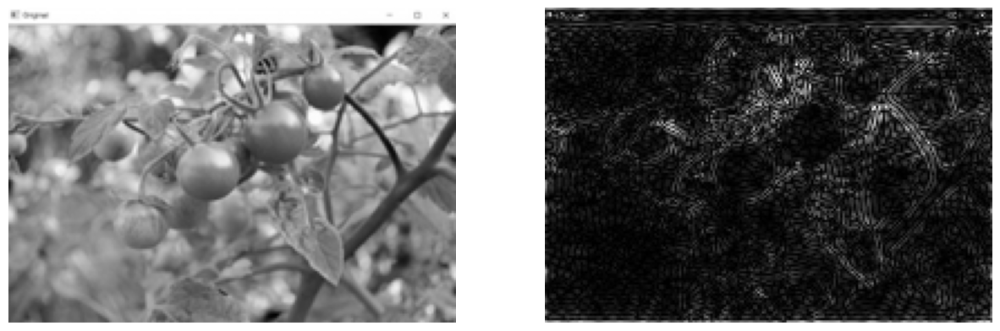

In [23]:
dft_shift_filtered = dft_shift * mask

# Compute Inverse DFT
dft_filtered = np.fft.ifftshift(dft_shift_filtered)
image_filtered = np.fft.ifft2(dft_filtered)
image_filtered = np.abs(image_filtered)


fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_gray, cmap= 'gray')
axs[1].imshow(image_filtered, cmap= 'gray')


for ax in axs:
    ax.axis('off')

# Experiment 5
### Harris Corner Detection
### 20th February

In [59]:
atm_harris = atm_rgb.copy()

In [60]:
gray = np.float32(atm_gray)

# Apply Harris corner detection
dst = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# Dilate the detected corners to mark them clearly
dst = cv2.dilate(dst, None)

# Thresholding to mark the corners in red
atm_harris[dst > 0.01 * dst.max()] = [0, 0, 255]


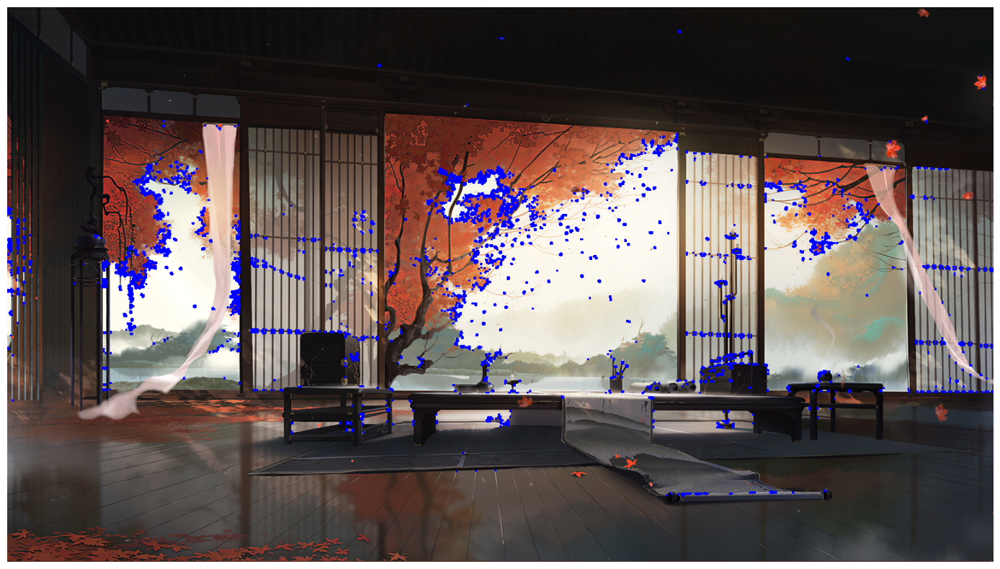

In [62]:
plt.figure(figsize=(20,10))
plt.imshow(atm_harris)
plt.axis('off')
plt.show()

## Sobel Edge detection

In [76]:
def sobel_edge(image, k = 3):

    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = k)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = k)
    
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    
    magnitude = np.uint8(255 * magnitude / np.max(magnitude))
    return magnitude

In [53]:
sobel_img = sobel_edge(img_gray)

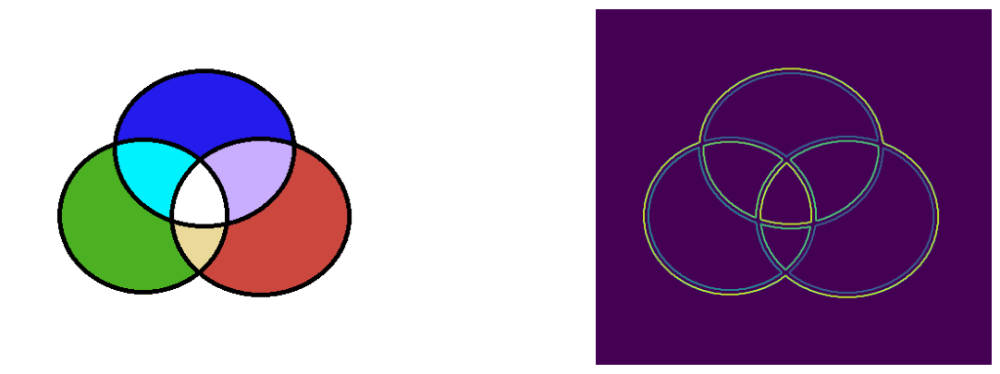

In [54]:

fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(img)
axs[1].imshow(sobel_img)


for ax in axs:
    ax.axis('off')

In [77]:
sobel_atm = sobel_edge(tmt_gray)

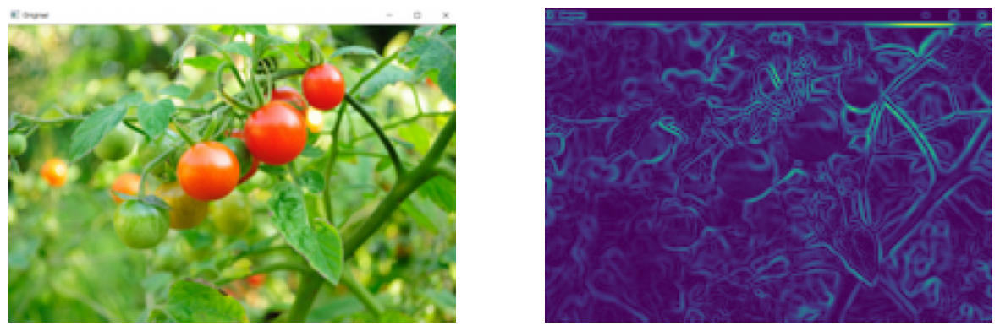

In [78]:
fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(tmt_rgb)
axs[1].imshow(sobel_atm)


for ax in axs:
    ax.axis('off')

## Canny Edge Detection

In [118]:
canny = cv2.Canny(atm, 100, 200)

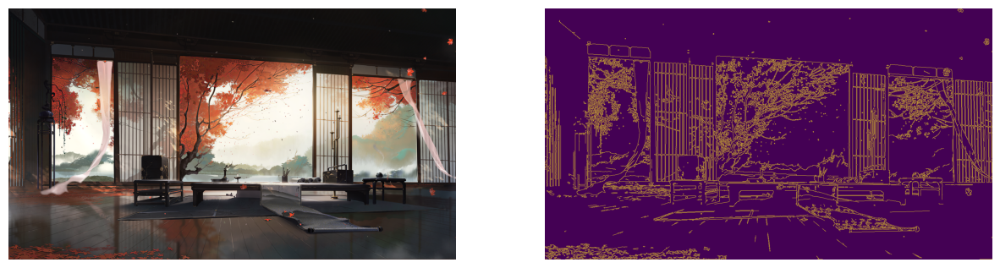

In [119]:
fig, axs = plt.subplots(1,2 , figsize= (15,5))

axs[0].imshow(atm_rgb)
axs[1].imshow(canny)


for ax in axs:
    ax.axis('off')